# <font style="color:blue">Object Detection</font>
On Open Images Dataset

In [5]:
!wget "https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1" -O Dataset.zip

--2020-10-01 13:51:59--  https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.67.1, 2620:100:6023:1::a27d:4301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.67.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/dl/k81ljpmzy3fgtx9/Dataset.zip [following]
--2020-10-01 13:52:00--  https://www.dropbox.com/s/dl/k81ljpmzy3fgtx9/Dataset.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc4779736ac2de60768f70c12400.dl.dropboxusercontent.com/cd/0/get/BAc7Jq2P6j540Xw-FPCEeEmH8yZCrPLMMuKtAvQbN2b8qEPKXOi4vep2r12yYJslS4nR0flFOA3XGnItykbn13skqeQ_zIArln2wKz2HUerHXdKSjEV9Wl_8wPOY11VwJwk/file?dl=1# [following]
--2020-10-01 13:52:00--  https://uc4779736ac2de60768f70c12400.dl.dropboxusercontent.com/cd/0/get/BAc7Jq2P6j540Xw-FPCEeEmH8yZCrPLMMuKtAvQbN2b8qEPKXOi4vep2r12yYJslS4nR0flFOA3XGnItykbn13skqeQ_zIArln2wKz2HUerHXdKS

In [6]:
!unzip -q Dataset.zip

# <font style="color:purple">Install Pre-built Detectron2</font> 

Checking torch and cuda version, so that we know which detectron version to download:

In [7]:
%cat /usr/local/cuda/version.txt

CUDA Version 10.1.243


In [8]:
!python -c "import torch; print(torch.__version__)"

1.6.0+cu101


In [9]:
!python -m pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


# <font style="color:purple">Imports</font> 

In [10]:
# import some common libraries
import numpy as np
import cv2
import random
import os
import matplotlib.pyplot as plt

In [11]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# model_zoo has lots of pre-trained models
from detectron2 import model_zoo

# DefaultTrainer is a class for training object detector
from detectron2.engine import DefaultTrainer
# DefaultPredictor is class for inference
from detectron2.engine import DefaultPredictor

# detectron2 has its configuration format
from detectron2.config import get_cfg
# detectron2 has implemented Visualizer of object detection
from detectron2.utils.visualizer import Visualizer

# from DatasetCatalog, detectron2 gets dataset and from MetadatCatalog it gets metadata of the dataset
from detectron2.data import DatasetCatalog, MetadataCatalog

# BoxMode supports bounding boxes in different format
from detectron2.structures import BoxMode

# COCOEvaluator based on COCO evaluation metric, inference_on_dataset is used for evaluation for a given metric
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# build_detection_test_loader, used to create test loader for evaluation
from detectron2.data import build_detection_test_loader

#  <font style="color:green">Plot Ground Truth</font> 

In [12]:
# configurations
train_data_root = 'Dataset/train/Vehicle registration plate'
test_data_root = 'Dataset/validation/Vehicle registration plate'

train_data_name = 'Reg_plate_train'
test_data_name = 'Reg_plate_test'

thing_classes = ['Reg-plate']

output_dir = 'outputs'


def get_imagefile_count(path):
    files = [f for f in os.listdir(path) if f.endswith('.jpg') and os.path.isfile(os.path.join(path, f))]
    return len(files)

train_img_count = get_imagefile_count(train_data_root)

In [13]:
# write a function that loads the dataset into detectron2's standard format
def get_licence_plates_dicts(data_root):
    dataset_dicts = []
    filenames = []
    for idx, filename in enumerate(os.listdir(data_root)):
        if filename.endswith(".jpg") and os.path.isfile(os.path.join(data_root, filename)): 
            record = {}
            image_path = os.path.join(data_root, filename)
            height, width = cv2.imread(image_path).shape[:2]
            
            record['file_name'] = image_path
            record['image_id'] = idx
            record['height'] = height
            record['width'] = width
            
            image_filename = os.path.basename(filename)
            image_name = os.path.splitext(image_filename)[0]
            annotation_path = os.path.join(data_root, 'Label', '{}.txt'.format(image_name))
            annotation_rows = []
            
            with open(annotation_path, "r") as f:
                for line in f:
                    temp = line.rstrip().split(" ")
                    annotation_rows.append(temp)
            
            objs = []
            
            for row in annotation_rows:
                xmin = int(float(row[3]))
                ymin = int(float(row[4]))
                xmax = int(float(row[5]))
                ymax = int(float(row[6]))
    
                obj= {
                    'bbox': [xmin, ymin, xmax, ymax],
                    'bbox_mode': BoxMode.XYXY_ABS,
                    'category_id': 0,
                    'iscrowd': 0
                }
        
                objs.append(obj)
            record['annotations'] = objs
            dataset_dicts.append(record)
    return dataset_dicts

In [14]:
# Register train and test data
# dataset can be registered only once with one name

# register train data
DatasetCatalog.register(name=train_data_name, 
                        func=lambda: get_licence_plates_dicts(train_data_root))
train_metadata = MetadataCatalog.get(train_data_name).set(thing_classes=thing_classes)

# register test data
DatasetCatalog.register(name=test_data_name, 
                        func=lambda: get_licence_plates_dicts(test_data_root))
test_metadata = MetadataCatalog.get(test_data_name).set(thing_classes=thing_classes)

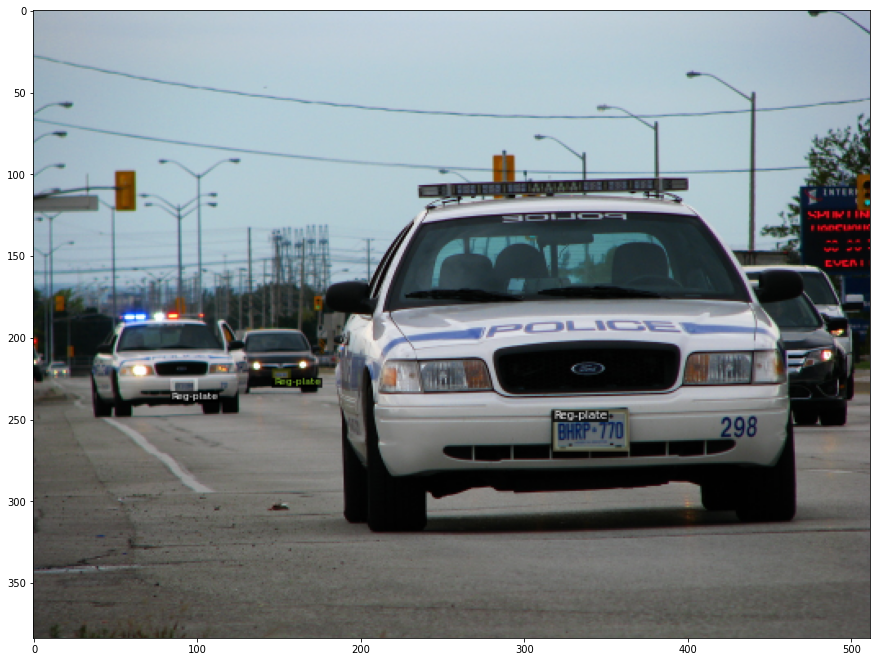

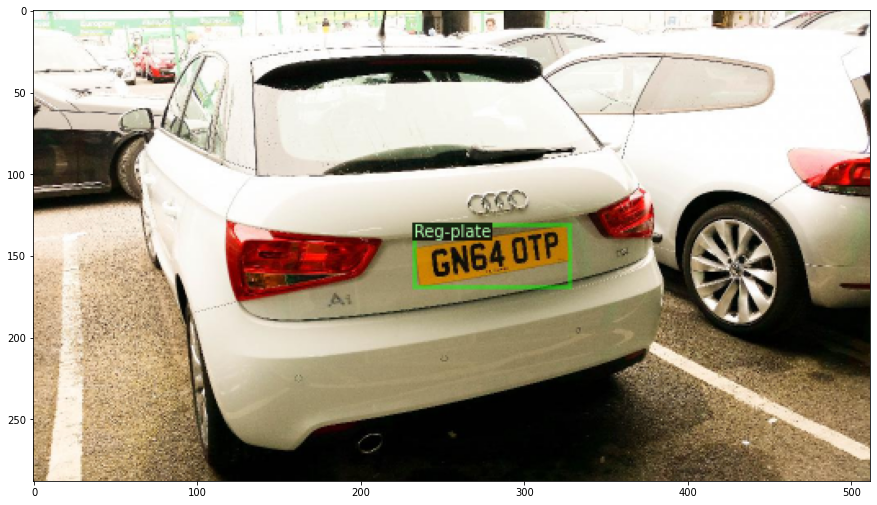

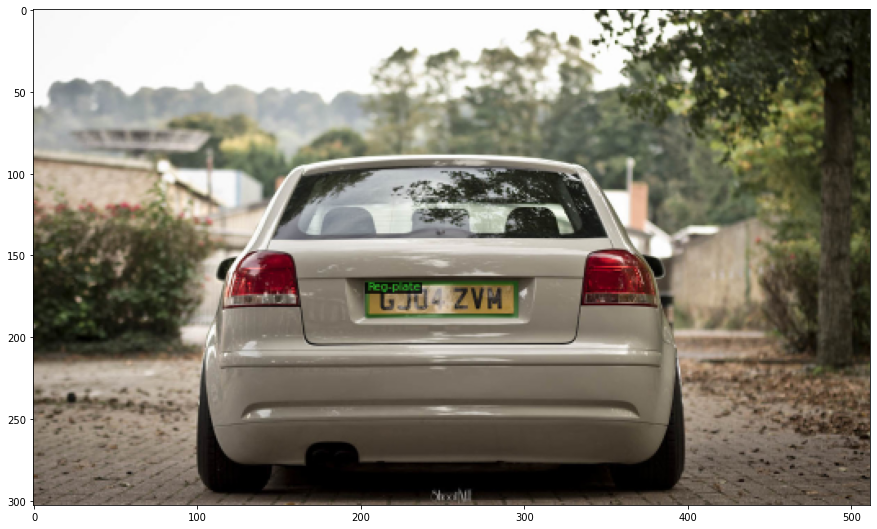

In [15]:
# lets visualize the data

test_data_dict = get_licence_plates_dicts(test_data_root)

for d in random.sample(test_data_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], 
                            metadata=test_metadata, 
                            scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize = (15, 15))
    plt.imshow(vis.get_image())
    plt.show()

#  <font style="color:green">Training the model</font> 

In [16]:
# detectron2 configuration

# default configuration
cfg = get_cfg()

# update configuration with RetinaNet configuration
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))

# We have registered the train and test data set with name traffic_sign_train and traffic_sign_test. 
# Let's replace the detectron2 default train dataset with our train dataset.
cfg.DATASETS.TRAIN = (train_data_name,)

# No metric implemented for the test dataset, we will have to update cfg.DATASET.TEST with empty tuple
cfg.DATASETS.TEST = ()

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


In [17]:
# data loader configuration
cfg.DATALOADER.NUM_WORKERS = 4

In [18]:
# Update model URL in detectron2 config file
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml")

In [19]:
# solver configuration

# batch size
cfg.SOLVER.IMS_PER_BATCH = 4

# choose a good learning rate
cfg.SOLVER.BASE_LR = 0.001

# We need to specify the number of iteration for training in detectron2, not the number of epochs.
# lets convert number of epoch to number or iteration (max iteration)

epoch = 1
max_iter = int(epoch * train_img_count / cfg.SOLVER.IMS_PER_BATCH)

cfg.SOLVER.MAX_ITER = max_iter 

In [20]:
# number of output class
# we have only one class that is Reg plate
cfg.MODEL.RETINANET.NUM_CLASSES = len(thing_classes)

In [21]:
# update create ouptput directory 
cfg.OUTPUT_DIR = output_dir
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [22]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir outputs

<IPython.core.display.Javascript object>

In [23]:
# training

# Create a trainer instance with the configuration.
trainer = DefaultTrainer(cfg) 

# if resume=False, because we don't have trained model yet. It will download model from model url and load it
trainer.resume_or_load(resume=False)

# start training
trainer.train()

[10/01 13:54:27 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_5bd44e.pkl: 152MB [00:15, 9.53MB/s]                           
Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (9, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.


[10/01 13:56:07 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[10/01 13:57:01 d2.utils.events]:  eta: 0:57:27  iter: 19  total_loss: 1.473  loss_cls: 0.962  loss_box_reg: 0.485  time: 2.6404  data_time: 0.0471  lr: 0.000020  max_mem: 4094M
[10/01 13:57:50 d2.utils.events]:  eta: 0:54:44  iter: 39  total_loss: 1.735  loss_cls: 1.199  loss_box_reg: 0.524  time: 2.5352  data_time: 0.0261  lr: 0.000040  max_mem: 4094M
[10/01 13:58:38 d2.utils.events]:  eta: 0:53:09  iter: 59  total_loss: 1.284  loss_cls: 0.878  loss_box_reg: 0.363  time: 2.4941  data_time: 0.0235  lr: 0.000060  max_mem: 4094M
[10/01 13:59:27 d2.utils.events]:  eta: 0:51:48  iter: 79  total_loss: 1.147  loss_cls: 0.883  loss_box_reg: 0.336  time: 2.4819  data_time: 0.0216  lr: 0.000080  max_mem: 4094M
[10/01 14:00:17 d2.utils.events]:  eta: 0:51:06  iter: 99  total_loss: 1.014  loss_cls: 0.735  loss_box_reg: 0.262  time: 2.4853  data_time: 0.0251  lr: 0.000100  max_mem: 4094M
[10/01 14:01:07 d2.utils.events]:  eta: 0:50:22  iter: 119  total_loss: 0.811  loss_cls: 0.495  loss_box_reg: 

In [24]:
!tensorboard dev upload --logdir outputs --name "Reg Plates Project"

2020-10-01 14:52:16.596430: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Data for the "graphs" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
Data for the "histograms" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
Data for the "hparams" plugin is now uploaded to TensorBoard.dev! Note that uploaded data is public. If you do not want to upload data for this plugin, use the "--plugins" command line argument.
Upload started and will continue reading any new data as it's added
to the logdir. To stop uploading, press Ctrl-C.

View your TensorBoard live at: https://tensorboard.dev/experiment/6NES3mhjT96MfgBY0OrEHg/

[2020-10-01T14:52:18] Uploader started.
[2020-10-01T14:52:1

#  <font style="color:green">Inference</font> 

In [25]:
# inference on our fine-tuned model

# By default detectron2 save the model with name model_final.pth
# update the model path in configuration that will be used to load the model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")


# update RetinaNet score threshold 
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5

cfg.DATASETS.TEST = (test_data_name,)

# create a predictor instance with the configuration (it has our fine-tuned model)
# this predictor does prdiction on a single image
predictor = DefaultPredictor(cfg)

Dataset/validation/Vehicle registration plate/fed5c0275ff3a440.jpg
{'instances': Instances(num_instances=2, image_height=683, image_width=1024, fields=[pred_boxes: Boxes(tensor([[  57.0778,  355.9061,  226.2673,  445.3759],
        [ 923.6301,  197.3484, 1024.0000,  240.8099]], device='cuda:0')), scores: tensor([0.8088, 0.5440], device='cuda:0'), pred_classes: tensor([0, 0], device='cuda:0')])}


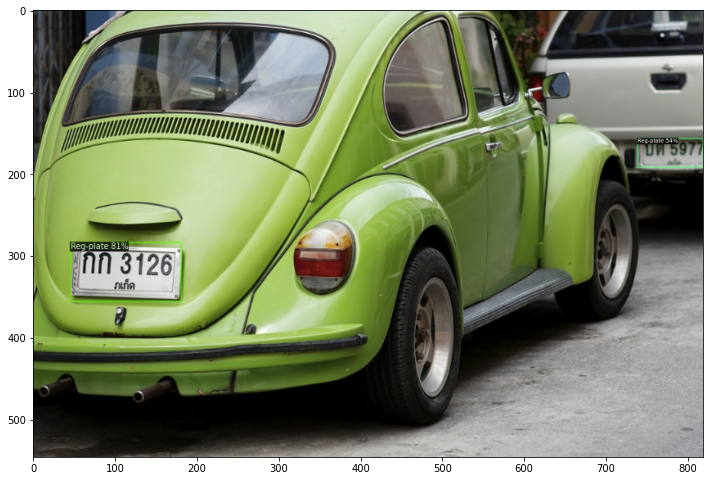

Dataset/validation/Vehicle registration plate/140e8d10ff02e7e7.jpg
{'instances': Instances(num_instances=1, image_height=683, image_width=1024, fields=[pred_boxes: Boxes(tensor([[496.4013, 389.8595, 562.9302, 425.4409]], device='cuda:0')), scores: tensor([0.8079], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}


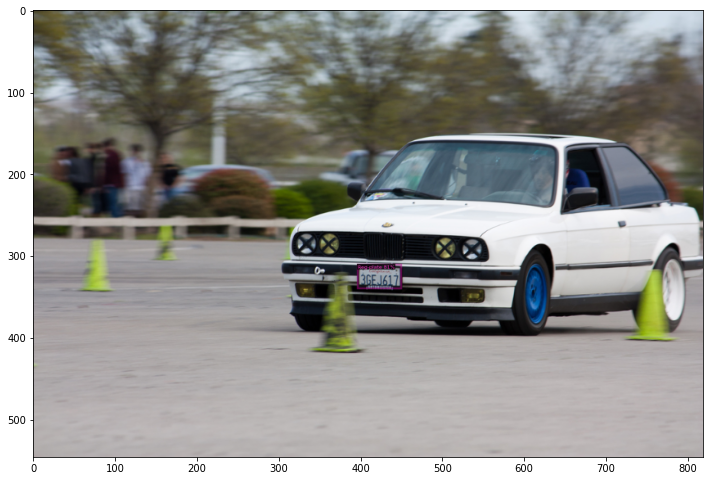

Dataset/validation/Vehicle registration plate/5021041c726b6ee4.jpg
{'instances': Instances(num_instances=0, image_height=768, image_width=1024, fields=[pred_boxes: Boxes(tensor([], device='cuda:0', size=(0, 4))), scores: tensor([], device='cuda:0'), pred_classes: tensor([], device='cuda:0', dtype=torch.int64)])}


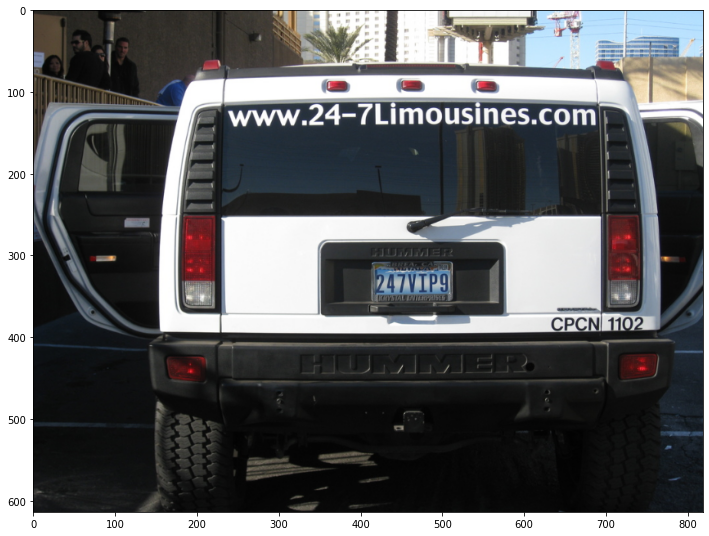

In [26]:
# let's have a look on prediction

for d in random.sample(test_data_dict, 3):
    print(d["file_name"])
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata, 
                   scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (12, 12))
    plt.imshow(v.get_image())
    plt.show()

#  <font style="color:green">COCO Detection Evaluation</font> 

In [27]:
# create directory for evaluation
eval_dir = os.path.join(cfg.OUTPUT_DIR, 'coco_eval')
os.makedirs(eval_dir, exist_ok=True)

# create evaluator instance with coco evaluator
evaluator = COCOEvaluator(dataset_name=test_data_name, 
                          cfg=cfg, 
                          distributed=False, 
                          output_dir=eval_dir)

# create validation data loader
val_loader = build_detection_test_loader(cfg, test_data_name)

# start validation
inference_on_dataset(trainer.model, val_loader, evaluator)

[10/01 14:53:28 d2.evaluation.coco_evaluation]: 'Reg_plate_test' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[10/01 14:53:28 d2.data.datasets.coco]: Converting annotations of dataset 'Reg_plate_test' to COCO format ...)
[10/01 14:53:34 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[10/01 14:53:34 d2.data.datasets.coco]: Conversion finished, #images: 386, #annotations: 512
[10/01 14:53:34 d2.data.datasets.coco]: Caching COCO format annotations at 'outputs/coco_eval/Reg_plate_test_coco_format.json' ...
[10/01 14:53:40 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| Reg-plate  | 512          |
|            |              |
[10/01 14:53:40 d2.data.common]: Serializing 386 elements to byte tensors and concatenating them all ...
[10/01 14:53:40 d2.data.common]: Serialized dataset takes 0.10 MiB
[10/01 14:53:40 d2.data.dataset_mapper]: Augme

OrderedDict([('bbox',
              {'AP': 58.08455523384228,
               'AP50': 86.6903738246982,
               'AP75': 67.71106199654707,
               'APl': 71.8989592706853,
               'APm': 67.46171512435404,
               'APs': 23.996366633551705})])